In [515]:
# imprting dependencies

import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.stem import PorterStemmer, WordNetLemmatizer
import string
import re
from textblob import TextBlob
import matplotlib as plt
from catboost import CatBoostClassifier, Pool
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score
from sklearn.preprocessing import StandardScaler
import numpy as np

In [514]:
# display options 
pd.reset_option("^display")

In [295]:
# Microsoft - past 10 years

import requests
import pandas as pd
from datetime import datetime, timedelta
import re
import time
import pickle

# Your NYT API key
NYT_API_KEY ='' # hidden

def fetch_nyt_articles(year, month):
    url = f'https://api.nytimes.com/svc/archive/v1/{year}/{month}.json'
    params = {'api-key': NYT_API_KEY}
    retries = 5
    for i in range(retries):
        try:
            response = requests.get(url, params=params)
            response.raise_for_status()
            return response.json()
        except requests.exceptions.HTTPError as e:
            if response.status_code == 429:
                retry_after = response.headers.get('Retry-After', None)
                wait_time = (2 ** i) + 1
                if retry_after is not None:
                    wait_time = int(retry_after)
                print(f"Rate limit exceeded. Retrying in {wait_time} seconds...")
                time.sleep(wait_time)
            else:
                raise e
    raise Exception(f"Failed to fetch articles after {retries} retries.")

def get_microsoft_articles(data):
    articles = data.get('response', {}).get('docs', [])
    microsoft_articles = []

    relevant_keywords = [
        "Microsoft Corp.", "Microsoft", "Windows", "Office", "Azure", "MSFT", "Microsoft stock", 
        "Microsoft shares", "Microsoft earnings", "Microsoft product", "Microsoft CEO", "Satya Nadella",
        "Microsoft Surface", "Microsoft 365", "Microsoft acquisition", "Microsoft technology", 
        "Microsoft hardware", "Visual Studio", "Xbox", "GitHub", "Teams", "LinkedIn", "Microsoft AI", 
        "Microsoft cloud"
    ]

    for article in articles:
        headline = article['headline']['main']
        lead_paragraph = article.get('lead_paragraph', '')
        combined_text = headline + ' ' + lead_paragraph

        if any(re.search(fr'\b{re.escape(keyword)}\b', combined_text, re.IGNORECASE) for keyword in relevant_keywords):
            microsoft_articles.append({
                'date': article['pub_date'][:10],
                'headline': headline
            })

    return microsoft_articles

def fetch_and_save_all_articles():
    today = datetime.today()
    start_date = today - timedelta(days=365 * 10)
    start_year = start_date.year
    start_month = start_date.month
    end_year = today.year
    end_month = today.month

    all_articles = []

    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            if year == start_year and month < start_month:
                continue
            if year == end_year and month > end_month:
                break
            print(f"Fetching articles for {year}-{month:02d}")
            try:
                data = fetch_nyt_articles(year, month)
                articles = get_microsoft_articles(data)
                if not articles:
                    print(f"No articles related to Microsoft Corp. were found for {year}-{month:02d}.")
                all_articles.extend(articles)
                # Save the all_articles list to a file after each year
                with open('all_articles_checkpoint.pkl', 'wb') as file:
                    pickle.dump(all_articles, file)
            except Exception as e:
                print(f"Error fetching articles for {year}-{month:02d}: {e}")
    
    with open('all_articles_final.pkl', 'wb') as file:
        pickle.dump(all_articles, file)
    print("Articles fetched and saved to 'all_articles_final.pkl'.")

def load_and_process_articles():
    with open('all_articles_final.pkl', 'rb') as file:
        all_articles = pickle.load(file)

    final_df1 = pd.DataFrame(all_articles, columns=['date', 'headline'])
    final_df1 = final_df1[final_df1['headline'].str.contains(r'\bMicrosoft\b', case=False, regex=True)]
    
    print(f"\nFinal DataFrame with shape {final_df1.shape}:")
    print(final_df1.head())
    
    final_df1.to_csv('microsoft_stock_headlines_past_10_years.csv', index=False)
    print("Data saved to 'microsoft_stock_headlines_past_10_years.csv'.")



Fetching articles for 2014-06
Fetching articles for 2014-07
Fetching articles for 2014-08
Fetching articles for 2014-09
Fetching articles for 2014-10
Fetching articles for 2014-11
Fetching articles for 2014-12
Fetching articles for 2015-01
Fetching articles for 2015-02
Fetching articles for 2015-03
Fetching articles for 2015-04
Fetching articles for 2015-05
Fetching articles for 2015-06
Fetching articles for 2015-07
Fetching articles for 2015-08
Fetching articles for 2015-09
Fetching articles for 2015-10
Fetching articles for 2015-11
Fetching articles for 2015-12
Fetching articles for 2016-01
Fetching articles for 2016-02
Fetching articles for 2016-03
Fetching articles for 2016-04
Fetching articles for 2016-05
Fetching articles for 2016-06
Fetching articles for 2016-07
Fetching articles for 2016-08
Fetching articles for 2016-09
Fetching articles for 2016-10
Fetching articles for 2016-11
Fetching articles for 2016-12
Fetching articles for 2017-01
Fetching articles for 2017-02
Fetching a

In [31]:
# TESLA

import requests
import pandas as pd
from datetime import datetime, timedelta
import re
import time

# Your NYT API key
NYT_API_KEY = '' # hidden

def fetch_nyt_articles(year, month):
    """
    Fetch articles from the New York Times Archive API for a given year and month.
    Implement retry logic with exponential backoff.
    """
    url = f'https://api.nytimes.com/svc/archive/v1/{year}/{month}.json'
    params = {'api-key': NYT_API_KEY}
    retries = 5
    for i in range(retries):
        try:
            response = requests.get(url, params=params)
            response.raise_for_status()  # Ensure request was successful
            return response.json()
        except requests.exceptions.HTTPError as e:
            if response.status_code == 429:
                # Extract 'Retry-After' from response headers if available
                retry_after = response.headers.get('Retry-After', None)
                wait_time = (2 ** i) + 1  # Default exponential backoff
                if retry_after is not None:
                    wait_time = int(retry_after)  # Use the server-specified wait time
                print(f"Rate limit exceeded. Retrying in {wait_time} seconds...")
                time.sleep(wait_time)
            else:
                raise e
    raise Exception(f"Failed to fetch articles after {retries} retries.")

def get_tesla_articles(data):
    articles = data.get('response', {}).get('docs', [])
    tesla_articles = []

    # List of relevant keywords for Tesla
    relevant_keywords = [
        r"\bTesla\b", r"\bTesla Inc.\b", r"\bElon Musk\b", r"\bTesla stock\b", r"\bTesla shares\b",
        r"\bTesla earnings\b", r"\bTesla CEO\b", r"\bElon Musk Tesla\b", r"\bTesla electric car\b",
        r"\bTesla vehicle\b", r"\bTesla Model\b", r"\bTesla Gigafactory\b", r"\bTesla battery\b",
        r"\bTesla energy\b", r"\bTesla AI\b", r"\bTesla autonomous\b", r"\bTesla software\b",
        r"\bTesla technology\b", r"\bTesla innovation\b", r"\bTesla self-driving\b"
    ]

    for article in articles:
        headline = article['headline']['main']
        lead_paragraph = article.get('lead_paragraph', '')
        combined_text = headline + ' ' + lead_paragraph

        # Check if any of the relevant keywords are present in the combined text
        if any(re.search(keyword, combined_text, flags=re.IGNORECASE) for keyword in relevant_keywords):
            tesla_articles.append({
                'date': article['pub_date'][:10],  # Only keep the date part
                'headline': headline
            })

    return tesla_articles

def main():
    today = datetime.today()
    start_date = today - timedelta(days=365 * 10)  # Approximately ten years ago
    start_year = start_date.year
    start_month = start_date.month
    end_year = today.year
    end_month = today.month

    all_articles = []

    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            # Skip months outside the desired range for the starting and ending years
            if year == start_year and month < start_month:
                continue
            if year == end_year and month > end_month:
                break
            print(f"Fetching articles for {year}-{month:02d}")
            try:
                data = fetch_nyt_articles(year, month)
                articles = get_tesla_articles(data)
                if not articles:
                    print(f"No articles related to Tesla were found for {year}-{month:02d}.")
                all_articles.extend(articles)
            except Exception as e:
                print(f"Error fetching articles for {year}-{month:02d}: {e}")

    final_df2 = pd.DataFrame(all_articles, columns=['date', 'headline'])

    print(f"\nFinal DataFrame with shape {final_df2.shape}:")
    print(final_df2.head())

    final_df2.to_csv('tesla_stock_headlines_past_10_years.csv', index=False)

if __name__ == "__main__":
    main()



Fetching articles for 2014-06
Fetching articles for 2014-07
Fetching articles for 2014-08
No articles related to Tesla were found for 2014-08.
Fetching articles for 2014-09
Fetching articles for 2014-10
Fetching articles for 2014-11
Fetching articles for 2014-12
No articles related to Tesla were found for 2014-12.
Fetching articles for 2015-01
Fetching articles for 2015-02
Fetching articles for 2015-03
Fetching articles for 2015-04
Fetching articles for 2015-05
Fetching articles for 2015-06
Fetching articles for 2015-07
Fetching articles for 2015-08
Fetching articles for 2015-09
Fetching articles for 2015-10
Fetching articles for 2015-11
Fetching articles for 2015-12
Fetching articles for 2016-01
Fetching articles for 2016-02
Fetching articles for 2016-03
No articles related to Tesla were found for 2016-03.
Fetching articles for 2016-04
Fetching articles for 2016-05
Fetching articles for 2016-06
Fetching articles for 2016-07
Fetching articles for 2016-08
Fetching articles for 2016-09
F

In [1]:
# NVIDIA 

import requests
import pandas as pd
from datetime import datetime, timedelta
import re
import time

# Your NYT API key
NYT_API_KEY = '' # hidden

def fetch_nyt_articles(year, month):
    url = f'https://api.nytimes.com/svc/archive/v1/{year}/{month}.json'
    params = {'api-key': NYT_API_KEY}
    retries = 5
    for i in range(retries):
        try:
            response = requests.get(url, params=params)
            response.raise_for_status()  # Ensure request was successful
            return response.json()
        except requests.exceptions.HTTPError as e:
            if response.status_code == 429:
                # Extract 'Retry-After' from response headers if available
                retry_after = response.headers.get('Retry-After', None)
                wait_time = (2 ** i) + 1  # Default exponential backoff
                if retry_after is not None:
                    wait_time = int(retry_after)  # Use the server-specified wait time
                print(f"Rate limit exceeded. Retrying in {wait_time} seconds...")
                time.sleep(wait_time)
            else:
                raise e
    raise Exception(f"Failed to fetch articles after {retries} retries.")

def get_nvidia_articles(data):
    articles = data.get('response', {}).get('docs', [])
    nvidia_articles = []

    relevant_keywords = [
        "NVIDIA Corp.", "NVIDIA", "GeForce", "RTX", "GPU", "CUDA", "NVIDIA stock", 
        "NVIDIA shares", "NVIDIA earnings", "NVIDIA product", "NVIDIA CEO", "Jensen Huang",
        "NVIDIA graphics", "NVIDIA AI", "NVIDIA acquisition", "NVIDIA technology", "NVIDIA hardware",
        "DLSS", "G-Sync", "CUDA cores", "NVIDIA Tegra", "NVIDIA Shield"
    ]

    for article in articles:
        headline = article['headline']['main']
        lead_paragraph = article.get('lead_paragraph', '')
        combined_text = headline + ' ' + lead_paragraph

        # Check if any of the relevant keywords are present in the combined text
        if any(re.search(fr'\b{re.escape(keyword)}\b', combined_text, re.IGNORECASE) for keyword in relevant_keywords):
            nvidia_articles.append({
                'date': article['pub_date'][:10],  # Only keep the date part
                'headline': headline
            })

    if not nvidia_articles:
        print("No relevant NVIDIA Corp. articles found in the current dataset.")

    return nvidia_articles

def main():
    today = datetime.today()
    start_date = today - timedelta(days=(365*10))  # Approximately ten years ago
    start_year = start_date.year
    start_month = start_date.month
    end_year = today.year
    end_month = today.month

    all_articles = []

    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            # Skip months outside the desired range for the starting and ending years
            if year == start_year and month < start_month:
                continue
            if year == end_year and month > end_month:
                break
            print(f"Fetching articles for {year}-{month:02d}")
            try:
                data = fetch_nyt_articles(year, month)
                articles = get_nvidia_articles(data)
                if not articles:
                    print(f"No articles related to NVIDIA Corp. were found for {year}-{month:02d}.")
                all_articles.extend(articles)
            except Exception as e:
                print(f"Error fetching articles for {year}-{month:02d}: {e}")

    final_df3 = pd.DataFrame(all_articles, columns=['date', 'headline'])

    print(f"\nFinal DataFrame with shape {final_df3.shape}:")
    print(final_df3.head())

    final_df3.to_csv('nvidia_stock_headlines_past_10_years.csv', index=False)

if __name__ == "__main__":
    main()

Fetching articles for 2014-06
No relevant NVIDIA Corp. articles found in the current dataset.
No articles related to NVIDIA Corp. were found for 2014-06.
Fetching articles for 2014-07
No relevant NVIDIA Corp. articles found in the current dataset.
No articles related to NVIDIA Corp. were found for 2014-07.
Fetching articles for 2014-08
No relevant NVIDIA Corp. articles found in the current dataset.
No articles related to NVIDIA Corp. were found for 2014-08.
Fetching articles for 2014-09
No relevant NVIDIA Corp. articles found in the current dataset.
No articles related to NVIDIA Corp. were found for 2014-09.
Fetching articles for 2014-10
No relevant NVIDIA Corp. articles found in the current dataset.
No articles related to NVIDIA Corp. were found for 2014-10.
Fetching articles for 2014-11
No relevant NVIDIA Corp. articles found in the current dataset.
No articles related to NVIDIA Corp. were found for 2014-11.
Fetching articles for 2014-12
No relevant NVIDIA Corp. articles found in the

## Preparing the Final Dataset

##### The idea is to combine the information of the three stocks-  Microsoft(MSFT), Nvidia (NVDA) , and Tesla(TSLA) by first craeting datasets individually for them and then in the end merging them.

### Preparing the combined dataset for Microsoft
##### The complete information for micrtosoft stocks over the period of past 10 years will be obtained by merging the three datasets: Microsoft headlines, Microsoft SEC filings and Microsoft stock price information. Now, the SEC filings dataset was created manually and it has only five years of data. Also, for some months, there were no headlines for Microsoft. Taking this into consideration, all the rows where both the "headlines" column and the "SEC filings-highlights' column have null values, have been removed since there is no textual data to perform the sentiment analysis. Thre are some months for which there are more than one headline. In those cases, the headlines have been merged and are seperated by the symbol " | ".

In [483]:
microsoft_headlines_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/microsoft_stock_headlines_past_10_years.csv")
print(microsoft_headlines_df.head())

         date  \
0  2014-06-09   
1  2014-06-11   
2  2014-06-11   
3  2014-06-11   
4  2014-06-11   

                                                                          headline  
0  At E3 Gaming Convention, Microsoft Shifts Emphasis of Xbox One Console to Games  
1                         Microsoft Protests Order to Disclose Email Stored Abroad  
2                      Order for Microsoft to Disclose Data Stored Outside of U.S.  
3                                The Old Is New Again at E3 for Sony and Microsoft  
4      Daily Report: Microsoft Challenges Federal Warrant for Data Stored Overseas  


In [484]:
microsoft_SEC_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/Microsoft_SEC_filings.csv",encoding='mac_roman')
print(microsoft_SEC_df)
print(microsoft_SEC_df.shape)

   Form type                                        Form description  \
0       10-Q                 Quarterly report [Sections 13 or 15(d)]   
1       10-Q                 Quarterly report [Sections 13 or 15(d)]   
2       10-Q                 Quarterly report [Sections 13 or 15(d)]   
3       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
4       10-Q                 Quarterly report [Sections 13 or 15(d)]   
5       10-Q                 Quarterly report [Sections 13 or 15(d)]   
6       10-Q                 Quarterly report [Sections 13 or 15(d)]   
7       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
8       10-Q                 Quarterly report [Sections 13 or 15(d)]   
9       10-Q                 Quarterly report [Sections 13 or 15(d)]   
10      10-Q                 Quarterly report [Sections 13 or 15(d)]   
11      10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
12      10-Q                 Quarterly report [Sections 13 or 15

In [485]:
# Convert date columns to datetime
microsoft_SEC_df['Filing date'] = pd.to_datetime(microsoft_SEC_df['Filing date'])
microsoft_SEC_df['Reporting date'] = pd.to_datetime(microsoft_SEC_df['Reporting date'])

def calculate_period(row):
    if row['Form type'] == '10-Q':
        start_date = row['Filing date'] - pd.DateOffset(months=4)
    elif row['Form type'] == '10-K':
        start_date = row['Filing date'] - pd.DateOffset(years=1)
    else:
        start_date = None  # Handle other cases as needed
    
    return f"{start_date.strftime('%d/%m/%y')}-{row['Filing date'].strftime('%d/%m/%y')}" if start_date else None

# Apply the function to create the 'period' column
microsoft_SEC_df['period'] = microsoft_SEC_df.apply(calculate_period, axis=1)

print(microsoft_SEC_df)

   Form type                                        Form description  \
0       10-Q                 Quarterly report [Sections 13 or 15(d)]   
1       10-Q                 Quarterly report [Sections 13 or 15(d)]   
2       10-Q                 Quarterly report [Sections 13 or 15(d)]   
3       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
4       10-Q                 Quarterly report [Sections 13 or 15(d)]   
5       10-Q                 Quarterly report [Sections 13 or 15(d)]   
6       10-Q                 Quarterly report [Sections 13 or 15(d)]   
7       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
8       10-Q                 Quarterly report [Sections 13 or 15(d)]   
9       10-Q                 Quarterly report [Sections 13 or 15(d)]   
10      10-Q                 Quarterly report [Sections 13 or 15(d)]   
11      10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
12      10-Q                 Quarterly report [Sections 13 or 15

/var/folders/tp/9j0jts_54cjbttcv217x3zgm0000gn/T/ipykernel_8107/1634399335.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  microsoft_SEC_df['Filing date'] = pd.to_datetime(microsoft_SEC_df['Filing date'])
/var/folders/tp/9j0jts_54cjbttcv217x3zgm0000gn/T/ipykernel_8107/1634399335.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  microsoft_SEC_df['Reporting date'] = pd.to_datetime(microsoft_SEC_df['Reporting date'])


In [319]:
microsoft_stock_prices_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/MSFT.csv")
print(microsoft_stock_prices_df.head())

         Date       Open       High        Low      Close  Adj Close  \
0  2014-01-01  37.349998  37.889999  34.630001  37.840000  31.804605   
1  2014-02-01  37.740002  38.459999  35.689999  38.310001  32.199646   
2  2014-03-01  37.919998  41.500000  37.490002  40.990002  34.710537   
3  2014-04-01  41.150002  41.660000  38.900002  40.400002  34.210911   
4  2014-05-01  40.240002  40.970001  38.509998  40.939999  34.668194   

      Volume  
0  930226200  
1  705304500  
2  778425700  
3  746112500  
4  574362900  


In [486]:
# Convert date columns to datetime
microsoft_headlines_df['date'] = pd.to_datetime(microsoft_headlines_df['date'])
microsoft_stock_prices_df['Date'] = pd.to_datetime(microsoft_stock_prices_df['Date'])
microsoft_SEC_df['Filing date'] = pd.to_datetime(microsoft_SEC_df['Filing date'])
microsoft_SEC_df['Reporting date'] = pd.to_datetime(microsoft_SEC_df['Reporting date'])

# Create 'Month-Year' column for headlines and stock prices
microsoft_headlines_df['Month-Year'] = microsoft_headlines_df['date'].dt.to_period('M')
microsoft_stock_prices_df['Month-Year'] = microsoft_stock_prices_df['Date'].dt.to_period('M')

# Function to get SEC filings highlights based on the 'period'
def get_sec_highlights(month_year, sec_df):
    sec_df['period_start'] = sec_df['Filing date'] - pd.DateOffset(months=4)  # Adjust for 10-Q filings
    sec_df['period_end'] = sec_df['Filing date']  # Filing date is the end of the period

    # Filter rows where Month-Year is within the period_start and period_end
    mask = (sec_df['period_start'].dt.to_period('M') <= month_year) & (sec_df['period_end'].dt.to_period('M') >= month_year)
    filtered_sec_df = sec_df[mask]

    # Aggregate highlights if there are multiple filings in the same Month-Year
    if not filtered_sec_df.empty:
        # Use unique to avoid repetition of identical SEC filings highlights
        highlights = filtered_sec_df['Highlights'].astype(str).unique()
        return ' | ANNUAL '.join(highlights)
    else:
        return None

microsoft_stock_prices_df['SEC filings-Highlights'] = microsoft_stock_prices_df['Month-Year'].apply(lambda x: get_sec_highlights(x, microsoft_SEC_df))

# Merge the dataframes on 'Month-Year'
microsoft_combined_df = pd.merge(microsoft_stock_prices_df, microsoft_headlines_df[['date', 'headline', 'Month-Year']], on='Month-Year', how='left')

# Group by 'Month-Year' and aggregate headlines with " | "
microsoft_final_df = microsoft_combined_df.groupby('Month-Year', as_index=False).agg({
    'headline': lambda x: ' | '.join(x.dropna().astype(str)),
    'SEC filings-Highlights': 'first',  # Take the first value since it should be the same for the group
    'Open': 'first',
    'Close': 'first'
})

microsoft_final_df.rename(columns={'headline': 'HEADLINES'}, inplace=True)

microsoft_final_df['HEADLINES'] = microsoft_final_df['HEADLINES'].replace('', np.nan)

microsoft_final_df['SEC filings-Highlights'] = microsoft_final_df['SEC filings-Highlights'].replace('', np.nan)


# Drop rows where both 'HEADLINES' and 'SEC filings-Highlights' are null
microsoft_final_df = microsoft_final_df.dropna(subset=['HEADLINES', 'SEC filings-Highlights'], how='all')

# Print the final dataframe and its shape
print(microsoft_final_df)
print(microsoft_final_df.shape)

microsoft_final_df.to_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/microsoft_final_data.csv', index=False)


    Month-Year  \
5      2014-06   
6      2014-07   
7      2014-08   
8      2014-09   
9      2014-10   
10     2014-11   
11     2014-12   
12     2015-01   
13     2015-02   
14     2015-03   
15     2015-04   
16     2015-05   
17     2015-06   
18     2015-07   
19     2015-08   
20     2015-09   
21     2015-10   
22     2015-11   
23     2015-12   
24     2016-01   
25     2016-02   
26     2016-03   
27     2016-04   
28     2016-05   
29     2016-06   
30     2016-07   
31     2016-08   
32     2016-09   
33     2016-10   
34     2016-11   
35     2016-12   
36     2017-01   
39     2017-04   
40     2017-05   
41     2017-06   
42     2017-07   
43     2017-08   
44     2017-09   
45     2017-10   
46     2017-11   
47     2017-12   
48     2018-01   
49     2018-02   
50     2018-03   
51     2018-04   
52     2018-05   
53     2018-06   
54     2018-07   
55     2018-08   
56     2018-09   
57     2018-10   
58     2018-11   
59     2018-12   
60     2019-01   
61     201

### Preparing the combined dataset for Nvidia
##### The complete information for micrtosoft stocks over the period of past 10 years will be obtained by merging the three datasets: Nvidia headlines, Nvidia SEC filings and Nvidia stock price information. Now, the SEC filings dataset was created manually and it has only five years of data. Also, for some months, there were no headlines for Nvidia. Taking this into consideration, all the rows where both the "headlines" column and the "SEC filings-highlights' column have null values, have been removed since there is no textual data to perform the sentiment analysis. Thre are some months for which there are more than one headline. In those cases, the headlines have been merged and are seperated by the symbol " | ".

In [487]:
nvidia_headlines_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/nvidia_stock_headlines_past_10_years.csv")
print(nvidia_headlines_df.head())
print(nvidia_headlines_df.shape)

         date                                                         headline
0  2016-07-18     Using Virtual Reality to Create a New Corporate Headquarters
1  2017-08-24               SoftBank and Fund to Invest $4.4 Billion in WeWork
2  2019-01-28       China Warnings From Caterpillar and Nvidia Hit U.S. Stocks
3  2020-09-12  SoftBank Said to Be Near Deal to Sell British Chip Designer Arm
4  2020-09-14                    Nvidia Buys Arm From SoftBank for $40 Billion
(36, 2)


In [488]:
nvidia_SEC_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/NVIDIA_SEC_filings.csv")
nvidia_SEC_df.dropna(how='all', inplace=True)
print(nvidia_SEC_df)
print(nvidia_SEC_df.shape)

   Form type                                        Form description  \
0       10-Q                 Quarterly report [Sections 13 or 15(d)]   
1       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
2       10-Q                 Quarterly report [Sections 13 or 15(d)]   
3       10-Q                 Quarterly report [Sections 13 or 15(d)]   
4       10-Q                 Quarterly report [Sections 13 or 15(d)]   
5       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
6       10-Q                 Quarterly report [Sections 13 or 15(d)]   
7       10-Q                 Quarterly report [Sections 13 or 15(d)]   
8       10-Q                 Quarterly report [Sections 13 or 15(d)]   
9       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
10      10-Q                 Quarterly report [Sections 13 or 15(d)]   
11      10-Q                 Quarterly report [Sections 13 or 15(d)]   
12      10-Q                 Quarterly report [Sections 13 or 15

In [489]:
# Convert date columns to datetime
nvidia_SEC_df['Filing date'] = pd.to_datetime(nvidia_SEC_df['Filing date'])
nvidia_SEC_df['Reporting date'] = pd.to_datetime(nvidia_SEC_df['Reporting date'])

# Define a function to calculate the period based on Form type
def calculate_period(row):
    if row['Form type'] == '10-Q':
        start_date = row['Filing date'] - pd.DateOffset(months=4)
    elif row['Form type'] == '10-K':
        start_date = row['Filing date'] - pd.DateOffset(years=1)
    else:
        start_date = None  # Handle other cases as needed
    
    return f"{start_date.strftime('%d/%m/%y')}-{row['Filing date'].strftime('%d/%m/%y')}" if start_date else None

# Apply the function to create the 'period' column
nvidia_SEC_df['period'] = nvidia_SEC_df.apply(calculate_period, axis=1)

# Display the updated dataframe
print(nvidia_SEC_df)
print(nvidia_SEC_df.shape)

   Form type                                        Form description  \
0       10-Q                 Quarterly report [Sections 13 or 15(d)]   
1       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
2       10-Q                 Quarterly report [Sections 13 or 15(d)]   
3       10-Q                 Quarterly report [Sections 13 or 15(d)]   
4       10-Q                 Quarterly report [Sections 13 or 15(d)]   
5       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
6       10-Q                 Quarterly report [Sections 13 or 15(d)]   
7       10-Q                 Quarterly report [Sections 13 or 15(d)]   
8       10-Q                 Quarterly report [Sections 13 or 15(d)]   
9       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
10      10-Q                 Quarterly report [Sections 13 or 15(d)]   
11      10-Q                 Quarterly report [Sections 13 or 15(d)]   
12      10-Q                 Quarterly report [Sections 13 or 15

/var/folders/tp/9j0jts_54cjbttcv217x3zgm0000gn/T/ipykernel_8107/1517477580.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  nvidia_SEC_df['Filing date'] = pd.to_datetime(nvidia_SEC_df['Filing date'])
/var/folders/tp/9j0jts_54cjbttcv217x3zgm0000gn/T/ipykernel_8107/1517477580.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  nvidia_SEC_df['Reporting date'] = pd.to_datetime(nvidia_SEC_df['Reporting date'])


In [490]:
nvidia_stock_prices_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/NVDA.csv")
print(nvidia_stock_prices_df.head())
print(nvidia_stock_prices_df.shape)

         Date     Open     High      Low    Close  Adj Close      Volume
0  2014-01-01  0.39800  0.41100  0.38325  0.39250   0.370251  5421052000
1  2014-02-01  0.39525  0.47625  0.38300  0.45950   0.433453  7722568000
2  2014-03-01  0.44925  0.47425  0.43900  0.44775   0.424276  7217988000
3  2014-04-01  0.46200  0.48650  0.44700  0.46175   0.437542  6937008000
4  2014-05-01  0.46875  0.47825  0.44275  0.47500   0.450097  5612600000
(127, 7)


In [491]:
# Convert date columns to datetime
nvidia_headlines_df['date'] = pd.to_datetime(nvidia_headlines_df['date'])
nvidia_stock_prices_df['Date'] = pd.to_datetime(nvidia_stock_prices_df['Date'])
nvidia_SEC_df['Filing date'] = pd.to_datetime(nvidia_SEC_df['Filing date'])
nvidia_SEC_df['Reporting date'] = pd.to_datetime(nvidia_SEC_df['Reporting date'])

# Create 'Month-Year' column for headlines and stock prices
nvidia_headlines_df['Month-Year'] = nvidia_headlines_df['date'].dt.to_period('M')
nvidia_stock_prices_df['Month-Year'] = nvidia_stock_prices_df['Date'].dt.to_period('M')

# Function to get SEC filings highlights based on the 'period'
def get_sec_highlights(month_year, sec_df):
    sec_df['period_start'] = sec_df['Filing date'] - pd.DateOffset(months=4)  # Adjust for 10-Q filings
    sec_df['period_end'] = sec_df['Filing date']  # Filing date is the end of the period

    # Filter rows where Month-Year is within the period_start and period_end
    mask = (sec_df['period_start'].dt.to_period('M') <= month_year) & (sec_df['period_end'].dt.to_period('M') >= month_year)
    filtered_sec_df = sec_df[mask]

    # Aggregate highlights if there are multiple filings in the same Month-Year
    if not filtered_sec_df.empty:
        # Use unique to avoid repetition of identical SEC filings highlights
        highlights = filtered_sec_df['Highlights'].astype(str).unique()
        return ' | ANNUAL '.join(highlights)
    else:
        return None

# Apply the function to create 'SEC filings-Highlights' column in nvidia_stock_prices_df
nvidia_stock_prices_df['SEC filings-Highlights'] = nvidia_stock_prices_df['Month-Year'].apply(lambda x: get_sec_highlights(x, nvidia_SEC_df))

# Merge the dataframes on 'Month-Year'
nvidia_combined_df = pd.merge(nvidia_stock_prices_df, nvidia_headlines_df[['date', 'headline', 'Month-Year']], on='Month-Year', how='left')

# Group by 'Month-Year' and aggregate headlines with " | "
nvidia_final_df = nvidia_combined_df.groupby('Month-Year', as_index=False).agg({
    'headline': lambda x: ' | '.join(x.dropna().astype(str)),
    'SEC filings-Highlights': 'first',  # Take the first value since it should be the same for the group
    'Open': 'first',
    'Close': 'first'
})

nvidia_final_df.rename(columns={'headline': 'HEADLINES'}, inplace=True)

nvidia_final_df['HEADLINES'] = nvidia_final_df['HEADLINES'].replace('', np.nan)

nvidia_final_df['SEC filings-Highlights'] = nvidia_final_df['SEC filings-Highlights'].replace('', np.nan)

# Drop rows where both 'HEADLINES' and 'SEC filings-Highlights' are null
nvidia_final_df = nvidia_final_df.dropna(subset=['HEADLINES', 'SEC filings-Highlights'], how='all')

# Print the final dataframe and its shape
print(nvidia_final_df)
print(nvidia_final_df.shape)

# Save the final dataframe to a CSV file
nvidia_final_df.to_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/nvidia_final_data.csv', index=False)


    Month-Year  \
30     2016-07   
43     2017-08   
57     2018-10   
58     2018-11   
59     2018-12   
60     2019-01   
61     2019-02   
62     2019-03   
63     2019-04   
64     2019-05   
65     2019-06   
66     2019-07   
67     2019-08   
68     2019-09   
69     2019-10   
70     2019-11   
71     2019-12   
72     2020-01   
73     2020-02   
74     2020-03   
75     2020-04   
76     2020-05   
77     2020-06   
78     2020-07   
79     2020-08   
80     2020-09   
81     2020-10   
82     2020-11   
83     2020-12   
84     2021-01   
85     2021-02   
86     2021-03   
87     2021-04   
88     2021-05   
89     2021-06   
90     2021-07   
91     2021-08   
92     2021-09   
93     2021-10   
94     2021-11   
95     2021-12   
96     2022-01   
97     2022-02   
98     2022-03   
99     2022-04   
100    2022-05   
101    2022-06   
102    2022-07   
103    2022-08   
104    2022-09   
105    2022-10   
106    2022-11   
107    2022-12   
108    2023-01   
109    202

### Preparing the combined dataset for Tesla
##### The complete information for Tesla stocks over the period of past 10 years will be obtained by merging the three datasets: Tesla headlines, Tesla SEC filings and Tesla stock price information. Now, the SEC filings dataset was created manually and it has only five years of data. Also, for some months, there were no headlines for Tesla. Taking this into consideration, all the rows where both the "headlines" column and the "SEC filings-highlights' column have null values, have been removed since there is no textual data to perform the sentiment analysis. Thre are some months for which there are more than one headline. In those cases, the headlines have been merged and are seperated by the symbol " | ".

In [492]:
tesla_headlines_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/tesla_stock_headlines_past_10_years.csv")
print(tesla_headlines_df.head())
print(tesla_headlines_df.shape)

         date                                            headline
0  2014-06-15       Out of Desert Dust, a Miracle on a Shoestring
1  2014-06-18                             Elon Musk’s Halo Effect
2  2014-07-31  Tesla and Panasonic Agree to Build Factory in U.S.
3  2014-09-04            Nevada and Tesla Hint at Site of Factory
4  2014-09-05          Nevada a Winner in Tesla’s Battery Contest
(1336, 2)


In [493]:
tesla_SEC_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/Tesla_SEC_filings.csv")
print(tesla_SEC_df)
print(tesla_SEC_df.shape)

   Form type                                        Form description  \
0       10-Q                 Quarterly report [Sections 13 or 15(d)]   
1       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
2       10-Q                 Quarterly report [Sections 13 or 15(d)]   
3       10-Q                 Quarterly report [Sections 13 or 15(d)]   
4       10-Q                 Quarterly report [Sections 13 or 15(d)]   
5       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
6       10-Q                 Quarterly report [Sections 13 or 15(d)]   
7       10-Q                 Quarterly report [Sections 13 or 15(d)]   
8       10-Q                 Quarterly report [Sections 13 or 15(d)]   
9       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
10      10-Q                 Quarterly report [Sections 13 or 15(d)]   
11      10-Q                 Quarterly report [Sections 13 or 15(d)]   
12      10-Q                 Quarterly report [Sections 13 or 15

In [494]:
# Convert date columns to datetime
tesla_SEC_df['Filing date'] = pd.to_datetime(tesla_SEC_df['Filing date'])
tesla_SEC_df['Reporting date'] = pd.to_datetime(tesla_SEC_df['Reporting date'])

# Define a function to calculate the period based on Form type
def calculate_period(row):
    if row['Form type'] == '10-Q':
        start_date = row['Filing date'] - pd.DateOffset(months=4)
    elif row['Form type'] == '10-K':
        start_date = row['Filing date'] - pd.DateOffset(years=1)
    else:
        start_date = None  # Handle other cases as needed
    
    return f"{start_date.strftime('%d/%m/%y')}-{row['Filing date'].strftime('%d/%m/%y')}" if start_date else None

# Apply the function to create the 'period' column
tesla_SEC_df['period'] = tesla_SEC_df.apply(calculate_period, axis=1)

# Display the updated dataframe
print(tesla_SEC_df)
print(tesla_SEC_df.shape)

   Form type                                        Form description  \
0       10-Q                 Quarterly report [Sections 13 or 15(d)]   
1       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
2       10-Q                 Quarterly report [Sections 13 or 15(d)]   
3       10-Q                 Quarterly report [Sections 13 or 15(d)]   
4       10-Q                 Quarterly report [Sections 13 or 15(d)]   
5       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
6       10-Q                 Quarterly report [Sections 13 or 15(d)]   
7       10-Q                 Quarterly report [Sections 13 or 15(d)]   
8       10-Q                 Quarterly report [Sections 13 or 15(d)]   
9       10-K  Annual report [Section 13 and 15(d), not S-K Item 405]   
10      10-Q                 Quarterly report [Sections 13 or 15(d)]   
11      10-Q                 Quarterly report [Sections 13 or 15(d)]   
12      10-Q                 Quarterly report [Sections 13 or 15

/var/folders/tp/9j0jts_54cjbttcv217x3zgm0000gn/T/ipykernel_8107/2638071376.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  tesla_SEC_df['Filing date'] = pd.to_datetime(tesla_SEC_df['Filing date'])
/var/folders/tp/9j0jts_54cjbttcv217x3zgm0000gn/T/ipykernel_8107/2638071376.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  tesla_SEC_df['Reporting date'] = pd.to_datetime(tesla_SEC_df['Reporting date'])


In [495]:
tesla_stock_prices_df = pd.read_csv("/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/TSLA.csv")
print(tesla_stock_prices_df.head())
print(tesla_stock_prices_df.shape)

         Date       Open       High        Low      Close  Adj Close  \
0  2014-01-01   9.986667  12.400000   9.111333  12.094000  12.094000   
1  2014-02-01  12.192667  17.666668  11.290667  16.320667  16.320667   
2  2014-03-01  15.817333  17.333332  13.533333  13.896667  13.896667   
3  2014-04-01  13.934667  15.715333  12.288000  13.859333  13.859333   
4  2014-05-01  13.805333  14.577333  11.814667  13.851333  13.851333   

       Volume  
0  2758984500  
1  3389311500  
2  2500284000  
3  2478117000  
4  2022151500  
(127, 7)


In [496]:
# Convert date columns to datetime
tesla_headlines_df['date'] = pd.to_datetime(tesla_headlines_df['date'])
tesla_stock_prices_df['Date'] = pd.to_datetime(tesla_stock_prices_df['Date'])
tesla_SEC_df['Filing date'] = pd.to_datetime(tesla_SEC_df['Filing date'])
tesla_SEC_df['Reporting date'] = pd.to_datetime(tesla_SEC_df['Reporting date'])

# Create 'Month-Year' column for headlines and stock prices
tesla_headlines_df['Month-Year'] = tesla_headlines_df['date'].dt.to_period('M')
tesla_stock_prices_df['Month-Year'] = tesla_stock_prices_df['Date'].dt.to_period('M')

# Function to get SEC filings highlights based on the 'period'
def get_sec_highlights(month_year, sec_df):
    sec_df['period_start'] = sec_df['Filing date'] - pd.DateOffset(months=4)  # Adjust for 10-Q filings
    sec_df['period_end'] = sec_df['Filing date']  # Filing date is the end of the period

    # Filter rows where Month-Year is within the period_start and period_end
    mask = (sec_df['period_start'].dt.to_period('M') <= month_year) & (sec_df['period_end'].dt.to_period('M') >= month_year)
    filtered_sec_df = sec_df[mask]

    # Aggregate highlights if there are multiple filings in the same Month-Year
    if not filtered_sec_df.empty:
        # Use unique to avoid repetition of identical SEC filings highlights
        highlights = filtered_sec_df['Highlights'].astype(str).unique()
        return ' | ANNUAL '.join(highlights)
    else:
        return None

# Apply the function to create 'SEC filings-Highlights' column in tesla_stock_prices_df
tesla_stock_prices_df['SEC filings-Highlights'] = tesla_stock_prices_df['Month-Year'].apply(lambda x: get_sec_highlights(x, tesla_SEC_df))

# Merge the dataframes on 'Month-Year'
tesla_combined_df = pd.merge(tesla_stock_prices_df, tesla_headlines_df[['date', 'headline', 'Month-Year']], on='Month-Year', how='left')

# Group by 'Month-Year' and aggregate headlines with " | "
tesla_final_df = tesla_combined_df.groupby('Month-Year', as_index=False).agg({
    'headline': lambda x: ' | '.join(x.dropna().astype(str)),
    'SEC filings-Highlights': 'first',  # Take the first value since it should be the same for the group
    'Open': 'first',
    'Close': 'first'
})

# Rename the 'headline' column to 'HEADLINES'
tesla_final_df.rename(columns={'headline': 'HEADLINES'}, inplace=True)

tesla_final_df['HEADLINES'] = tesla_final_df['HEADLINES'].replace('', np.nan)

tesla_final_df['SEC filings-Highlights'] = tesla_final_df['SEC filings-Highlights'].replace('', np.nan)


tesla_final_df = tesla_final_df.dropna(subset=['HEADLINES', 'SEC filings-Highlights'], how='all')

print(tesla_final_df)
print(tesla_final_df.shape)

tesla_final_df.to_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/tesla_final_data.csv', index=False)


    Month-Year  \
5      2014-06   
6      2014-07   
8      2014-09   
9      2014-10   
10     2014-11   
12     2015-01   
13     2015-02   
14     2015-03   
15     2015-04   
16     2015-05   
17     2015-06   
18     2015-07   
19     2015-08   
20     2015-09   
21     2015-10   
22     2015-11   
23     2015-12   
24     2016-01   
25     2016-02   
27     2016-04   
28     2016-05   
29     2016-06   
30     2016-07   
31     2016-08   
32     2016-09   
33     2016-10   
34     2016-11   
35     2016-12   
36     2017-01   
37     2017-02   
38     2017-03   
39     2017-04   
40     2017-05   
41     2017-06   
42     2017-07   
43     2017-08   
44     2017-09   
45     2017-10   
46     2017-11   
47     2017-12   
48     2018-01   
49     2018-02   
50     2018-03   
51     2018-04   
52     2018-05   
53     2018-06   
54     2018-07   
55     2018-08   
56     2018-09   
57     2018-10   
58     2018-11   
59     2018-12   
60     2019-01   
61     2019-02   
62     201

### Combining the three datasets
##### Now, we will combine the three datasets and add two new columns "Stock Name" and "Label". The label will be 1 if open price < close price, 0 if open price = close price and -1 if open price > close price

In [497]:
import pandas as pd

tesla_final_df['Stock name'] = 'Tesla'
tesla_final_df['Label'] = (tesla_final_df['Close'] > tesla_final_df['Open']).astype(int) - (tesla_final_df['Close'] < tesla_final_df['Open']).astype(int)

microsoft_final_df['Stock name'] = 'Microsoft'
microsoft_final_df['Label'] = (microsoft_final_df['Close'] > microsoft_final_df['Open']).astype(int) - (microsoft_final_df['Close'] < microsoft_final_df['Open']).astype(int)

nvidia_final_df['Stock name'] = 'nvidia'
nvidia_final_df['Label'] = (nvidia_final_df['Close'] > nvidia_final_df['Open']).astype(int) - (nvidia_final_df['Close'] < nvidia_final_df['Open']).astype(int)

combined_df = pd.concat([tesla_final_df, microsoft_final_df, nvidia_final_df], axis=0, ignore_index=True)

combined_df.reset_index(drop=True, inplace=True)

combined_df.sort_values(by='Month-Year', inplace=True)

combined_df = combined_df.rename(columns={'SEC filings-Highlights': 'SEC filings-Highlights Quarter'})

print(combined_df)
print(combined_df.shape)

combined_df.to_csv('combined_stock_data.csv', index=False)


    Month-Year  \
0      2014-06   
118    2014-06   
1      2014-07   
119    2014-07   
120    2014-08   
2      2014-09   
121    2014-09   
122    2014-10   
3      2014-10   
4      2014-11   
123    2014-11   
124    2014-12   
125    2015-01   
5      2015-01   
126    2015-02   
6      2015-02   
127    2015-03   
7      2015-03   
128    2015-04   
8      2015-04   
129    2015-05   
9      2015-05   
10     2015-06   
130    2015-06   
11     2015-07   
131    2015-07   
12     2015-08   
132    2015-08   
13     2015-09   
133    2015-09   
14     2015-10   
134    2015-10   
15     2015-11   
135    2015-11   
136    2015-12   
16     2015-12   
137    2016-01   
17     2016-01   
18     2016-02   
138    2016-02   
139    2016-03   
19     2016-04   
140    2016-04   
20     2016-05   
141    2016-05   
21     2016-06   
142    2016-06   
236    2016-07   
22     2016-07   
143    2016-07   
144    2016-08   
23     2016-08   
145    2016-09   
24     2016-09   
146    201

In [498]:
# Creating a column for Annual Hghlights

# Function to clean and extract 'ANNUAL' highlights
def clean_and_extract_annual(text):
    if isinstance(text, str):
        # Remove everything from the second " | ANNUAL" onward
        parts = text.split(' | ANNUAL', 2)
        if len(parts) > 2:
            text = ' | ANNUAL'.join(parts[:2])

        # Extract the text after the first " | ANNUAL"
        split_text = text.split(' | ANNUAL', 1)
        if len(split_text) > 1:
            quarter_highlights = split_text[0].strip()
            annual_highlights = split_text[1].strip()
            return quarter_highlights, annual_highlights
        else:
            return text.strip(), None
    return text, None

# Apply the function to extract and clean
combined_df[['SEC filings-Highlights Quarter', 'SEC filings-Highlights Annual']] = combined_df.apply(
    lambda row: pd.Series(clean_and_extract_annual(row['SEC filings-Highlights Quarter'])),
    axis=1
)

print(combined_df)

combined_df.to_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/combined_stock_data1.csv', index=False)

    Month-Year  \
0      2014-06   
118    2014-06   
1      2014-07   
119    2014-07   
120    2014-08   
2      2014-09   
121    2014-09   
122    2014-10   
3      2014-10   
4      2014-11   
123    2014-11   
124    2014-12   
125    2015-01   
5      2015-01   
126    2015-02   
6      2015-02   
127    2015-03   
7      2015-03   
128    2015-04   
8      2015-04   
129    2015-05   
9      2015-05   
10     2015-06   
130    2015-06   
11     2015-07   
131    2015-07   
12     2015-08   
132    2015-08   
13     2015-09   
133    2015-09   
14     2015-10   
134    2015-10   
15     2015-11   
135    2015-11   
136    2015-12   
16     2015-12   
137    2016-01   
17     2016-01   
18     2016-02   
138    2016-02   
139    2016-03   
19     2016-04   
140    2016-04   
20     2016-05   
141    2016-05   
21     2016-06   
142    2016-06   
236    2016-07   
22     2016-07   
143    2016-07   
144    2016-08   
23     2016-08   
145    2016-09   
24     2016-09   
146    201

In [499]:
STOCKS_DATA_FINAL_DF=pd.read_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/combined_stock_data1.csv')

### Preprocessing DATA

##### The data in 'HEADLINES','SEC filings-Highlights Quarter' and 'SEC filings-Highlights Annual' has textual data which will be preprocessed to make feature extraction for model development easier. Since data is already very clean, all we are doing is converting to lowercase and removing punctuations.

In [500]:
# Function to preprocess text

def preprocess_text(text):
    if isinstance(text, str):
        # Convert to lowercase
        text = text.lower()
        # Remove punctuation
        text = re.sub(r'[^\w\s]', '', text)
    elif pd.isna(text):  # Handle NaN values
        pass  # Do nothing, text remains NaN
    else:
        text = ''  # Convert other non-string types to empty string
    return text

In [501]:
# making clean columns
STOCKS_DATA_FINAL_DF['HEADLINES_clean'] = STOCKS_DATA_FINAL_DF['HEADLINES'].apply(preprocess_text)
STOCKS_DATA_FINAL_DF['SEC filings-Highlights Quarter_clean'] = STOCKS_DATA_FINAL_DF['SEC filings-Highlights Quarter'].apply(preprocess_text)
STOCKS_DATA_FINAL_DF['SEC filings-Highlights Annual_clean'] = STOCKS_DATA_FINAL_DF['SEC filings-Highlights Annual'].apply(preprocess_text)


In [502]:
# Function to calculate sentiment scores
def calculate_sentiment(text):
    if isinstance(text, str):
        analysis = TextBlob(text)
        polarity = analysis.sentiment.polarity
        subjectivity = analysis.sentiment.subjectivity
        return polarity, subjectivity
    else:
        return None, None


In [503]:

# Calculate weighted sentiment scores
def calculate_weights(row):
    weights = {
        'HEADLINES_clean': 0,
        'SEC filings-Highlights Quarter_clean': 0,
        'SEC filings-Highlights Annual_clean': 0
    }
    
    num_present = 0
    
    if isinstance(row['SEC filings-Highlights Quarter_clean'], str):
        weights['SEC filings-Highlights Quarter_clean'] = 0.25
        num_present += 1
        
    if isinstance(row['SEC filings-Highlights Annual_clean'], str):
        weights['SEC filings-Highlights Annual_clean'] = 0.15
        num_present += 1
        
    if isinstance(row['HEADLINES_clean'], str):
        weights['HEADLINES_clean'] = 0.6
        num_present += 1
    
    if num_present == 1:
        for key in weights:
            if weights[key] > 0:
                weights[key] = 1.0
    else:
        total_weight = sum(weights.values())
        
        if total_weight == 0:
            weights['HEADLINES_clean'] = 0.3
            weights['SEC filings-Highlights Quarter_clean'] = 0.4
            weights['SEC filings-Highlights Annual_clean'] = 0.3
        else:
            if weights['SEC filings-Highlights Quarter_clean'] > 0:
                desired_annual_weight = 0.3
                desired_headlines_weight = 0.3
                adjust_ratio = 1.3  # SEC filings-Highlights Quarter_clean should be 30% more
                weights['SEC filings-Highlights Quarter_clean'] *= adjust_ratio
        
        # Normalize weights to sum up to 1
        if total_weight > 0:
            for key in weights:
                weights[key] /= total_weight
    
    return weights


In [504]:
def apply_weighted_sentiment(row):
    weighted_polarity = 0
    weighted_subjectivity = 0
    positive_score = 0
    negative_score = 0
    neutral_score = 0
    
    # Calculate weights for the row
    weights = calculate_weights(row)
    
    # Iterate through columns and calculate sentiment
    for col, weight in weights.items():
        text = row[col]
        if isinstance(text, str):
            polarity, subjectivity = calculate_sentiment(text)
            weighted_polarity += polarity * weight
            weighted_subjectivity += subjectivity * weight
            
            # Calculate positive, negative, neutral scores
            if polarity > 0:
                positive_score += polarity * weight
            elif polarity < 0:
                negative_score += abs(polarity) * weight
            else:
                neutral_score += weight
    
    return weighted_polarity, weighted_subjectivity, positive_score, negative_score, neutral_score

In [505]:
(STOCKS_DATA_FINAL_DF['Sentiment_Polarity'], 
 STOCKS_DATA_FINAL_DF['Sentiment_Subjectivity'],
 STOCKS_DATA_FINAL_DF['Positive_Score'], 
 STOCKS_DATA_FINAL_DF['Negative_Score'],
 STOCKS_DATA_FINAL_DF['Neutral_Score']) = zip(*STOCKS_DATA_FINAL_DF.apply(apply_weighted_sentiment, axis=1))

# Fill NaN values with zeros for sentiment scores
sentiment_cols = ['Sentiment_Polarity', 'Sentiment_Subjectivity', 'Positive_Score', 'Negative_Score', 'Neutral_Score']
STOCKS_DATA_FINAL_DF[sentiment_cols] = STOCKS_DATA_FINAL_DF[sentiment_cols].fillna(0)

# Display the DataFrame with sentiment scores
print("DataFrame with Sentiment Scores:")
print(STOCKS_DATA_FINAL_DF)


DataFrame with Sentiment Scores:
    Month-Year  \
0      2014-06   
1      2014-06   
2      2014-07   
3      2014-07   
4      2014-08   
5      2014-09   
6      2014-09   
7      2014-10   
8      2014-10   
9      2014-11   
10     2014-11   
11     2014-12   
12     2015-01   
13     2015-01   
14     2015-02   
15     2015-02   
16     2015-03   
17     2015-03   
18     2015-04   
19     2015-04   
20     2015-05   
21     2015-05   
22     2015-06   
23     2015-06   
24     2015-07   
25     2015-07   
26     2015-08   
27     2015-08   
28     2015-09   
29     2015-09   
30     2015-10   
31     2015-10   
32     2015-11   
33     2015-11   
34     2015-12   
35     2015-12   
36     2016-01   
37     2016-01   
38     2016-02   
39     2016-02   
40     2016-03   
41     2016-04   
42     2016-04   
43     2016-05   
44     2016-05   
45     2016-06   
46     2016-06   
47     2016-07   
48     2016-07   
49     2016-07   
50     2016-08   
51     2016-08   
52     2016-0

In [506]:
STOCKS_DATA_FINAL_DF.to_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/rough.csv', index=False)

### Developing the model

In [507]:
#Prepare Data
X = STOCKS_DATA_FINAL_DF[['Sentiment_Polarity', 'Sentiment_Subjectivity', 'Positive_Score', 'Negative_Score', 'Neutral_Score']]
y = STOCKS_DATA_FINAL_DF['Label']

#Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Data Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Create a CatBoost Pool
train_pool = Pool(X_train_scaled, y_train)
test_pool = Pool(X_test_scaled, y_test)

#Initialize CatBoost Classifier with more detailed parameters
catboost_model = CatBoostClassifier(random_state=42, eval_metric='AUC', verbose=100)

#Hyperparameter Tuning with Grid Search
param_grid = {
    'iterations': [100, 200, 300],
    'depth': [4, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'l2_leaf_reg': [1, 3, 5, 7],
    'border_count': [32, 64, 128, 256]
}

grid_search = GridSearchCV(catboost_model, param_grid, cv=5, scoring='roc_auc', verbose=100)
grid_search.fit(X_train_scaled, y_train)

print("Best Parameters:", grid_search.best_params_)
catboost_model = grid_search.best_estimator_

# Step 7: Train the Best Model
catboost_model.fit(train_pool)

# Step 8: Make Predictions
y_pred = catboost_model.predict(X_test_scaled)
y_pred_proba = catboost_model.predict_proba(X_test_scaled)[:, 1]

# Step 9: Save the Model
model_filename = 'catboost_model.pkl1'
joblib.dump(catboost_model, model_filename)
print(f"Model saved as {model_filename}")




Fitting 5 folds for each of 576 candidates, totalling 2880 fits
[CV 1/5; 1/576] START border_count=32, depth=4, iterations=100, l2_leaf_reg=1, learning_rate=0.01
0:	total: 964us	remaining: 95.5ms
99:	total: 9.79ms	remaining: 0us
[CV 1/5; 1/576] END border_count=32, depth=4, iterations=100, l2_leaf_reg=1, learning_rate=0.01;, score=0.530 total time=   0.0s
[CV 2/5; 1/576] START border_count=32, depth=4, iterations=100, l2_leaf_reg=1, learning_rate=0.01
0:	total: 120us	remaining: 12ms
99:	total: 8.14ms	remaining: 0us
[CV 2/5; 1/576] END border_count=32, depth=4, iterations=100, l2_leaf_reg=1, learning_rate=0.01;, score=0.536 total time=   0.0s
[CV 3/5; 1/576] START border_count=32, depth=4, iterations=100, l2_leaf_reg=1, learning_rate=0.01
0:	total: 107us	remaining: 10.6ms
99:	total: 7.75ms	remaining: 0us
[CV 3/5; 1/576] END border_count=32, depth=4, iterations=100, l2_leaf_reg=1, learning_rate=0.01;, score=0.427 total time=   0.0s
[CV 4/5; 1/576] START border_count=32, depth=4, iteratio

In [512]:
scaler_filename = 'scaler.pkl'
joblib.dump(scaler, scaler_filename)
print(f"Scaler saved as {scaler_filename}")

Scaler saved as scaler.pkl


In [508]:
# Detailed Classification Report

print("Detailed Classification Report:")
print(classification_report(y_test, y_pred, zero_division=0))

# Accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

# ROC-AUC Score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC-AUC Score: {roc_auc:.2f}")

Detailed Classification Report:
              precision    recall  f1-score   support

          -1       0.33      0.27      0.30        22
           1       0.64      0.70      0.67        40

    accuracy                           0.55        62
   macro avg       0.48      0.49      0.48        62
weighted avg       0.53      0.55      0.54        62

Accuracy: 0.55
ROC-AUC Score: 0.61


### Preparing the test dataset

##### I have taken microsft stock data as the test dataset. I will apply the same transformations as before to calculate the weighted subjectivity score, weighted polarity score, negative score, positive score, neutral score,etc

In [516]:
TEST_DF= pd.read_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/test_dataset_microsoft.csv')

In [517]:
print(TEST_DF)

   Month-Year                                          HEADLINES  \
0     2018-09                                                NaN   
1     2018-10  Paul G. Allen, Microsoft‚Äôs Co-Founder, Is De...   
2     2018-11  Microsoft Is Worth as Much as Apple. How Did T...   
3     2018-12                                                NaN   
4     2019-01  Microsoft Pledges $500 Million for Affordable ...   
..        ...                                                ...   
62    2023-12  Microsoft Agrees to Remain Neutral in Union Ca...   
63    2024-01  Microsoft Debates What to Do With A.I. Lab in ...   
64    2024-02  Why Microsoft Has Accepted Unions, Unlike Its ...   
65    2024-03  Why Elon Musk‚Äôs OpenAI Lawsuit Leans on A.I....   
66    2024-04  Regulators Force Another Microsoft Split | Mic...   

                               SEC filings-Highlights        Open       Close  
0   \t\n1. Commercial cloud revenue, which include...  110.849998  114.370003  
1   \t\n1. Commercial c

In [518]:
TEST_DF['Label'] = (TEST_DF['Close'] > TEST_DF['Open']).astype(int) - (TEST_DF['Close'] < TEST_DF['Open']).astype(int)
TEST_DF.rename(columns={'SEC filings-Highlights': 'SEC filings-Highlights Quarter'}, inplace=True)

In [519]:

# Function to clean and extract 'ANNUAL' highlights
def clean_and_extract_annual(text):
    if isinstance(text, str):
        # Remove everything from the second " | ANNUAL" onward
        parts = text.split(' | ANNUAL', 2)
        if len(parts) > 2:
            text = ' | ANNUAL'.join(parts[:2])

        # Extract the text after the first " | ANNUAL"
        split_text = text.split(' | ANNUAL', 1)
        if len(split_text) > 1:
            quarter_highlights = split_text[0].strip()
            annual_highlights = split_text[1].strip()
            return quarter_highlights, annual_highlights
        else:
            return text.strip(), None
    return text, None

TEST_DF[['SEC filings-Highlights Quarter', 'SEC filings-Highlights Annual']] = TEST_DF.apply(
    lambda row: pd.Series(clean_and_extract_annual(row['SEC filings-Highlights Quarter'])),
    axis=1
)

print(TEST_DF)

TEST_DF.to_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/TEST_DF.csv', index=False)

   Month-Year                                          HEADLINES  \
0     2018-09                                                NaN   
1     2018-10  Paul G. Allen, Microsoft‚Äôs Co-Founder, Is De...   
2     2018-11  Microsoft Is Worth as Much as Apple. How Did T...   
3     2018-12                                                NaN   
4     2019-01  Microsoft Pledges $500 Million for Affordable ...   
..        ...                                                ...   
62    2023-12  Microsoft Agrees to Remain Neutral in Union Ca...   
63    2024-01  Microsoft Debates What to Do With A.I. Lab in ...   
64    2024-02  Why Microsoft Has Accepted Unions, Unlike Its ...   
65    2024-03  Why Elon Musk‚Äôs OpenAI Lawsuit Leans on A.I....   
66    2024-04  Regulators Force Another Microsoft Split | Mic...   

                       SEC filings-Highlights Quarter        Open       Close  \
0   1. Commercial cloud revenue, which includes Mi...  110.849998  114.370003   
1   1. Commercial clo

### Preprocessing the test dataframe

In [ ]:
# making clean columns
TEST_DF['HEADLINES_clean'] = TEST_DF['HEADLINES'].apply(preprocess_text)
TEST_DF['SEC filings-Highlights Quarter_clean'] = TEST_DF['SEC filings-Highlights Quarter'].apply(preprocess_text)
TEST_DF['SEC filings-Highlights Annual_clean'] = TEST_DF['SEC filings-Highlights Annual'].apply(preprocess_text)

In [ ]:
(TEST_DF['Sentiment_Polarity'], 
 TEST_DF['Sentiment_Subjectivity'],
 TEST_DF['Positive_Score'], 
 TEST_DF['Negative_Score'],
 TEST_DF['Neutral_Score']) = zip(*TEST_DF.apply(apply_weighted_sentiment, axis=1))

sentiment_cols = ['Sentiment_Polarity', 'Sentiment_Subjectivity', 'Positive_Score', 'Negative_Score', 'Neutral_Score']
TEST_DF[sentiment_cols] = TEST_DF[sentiment_cols].fillna(0)
TEST_DF['Stock name'] = 'Microsoft'
print("DataFrame with Sentiment Scores:")
print(TEST_DF)
TEST_DF.to_csv('/Users/ashitasrivastava/Desktop/projects/stock_sentiment analysis/dataset/rough.csv', index=False)

DataFrame with Sentiment Scores:
   Month-Year                                          HEADLINES  \
0     2018-09                                                NaN   
1     2018-10  Paul G. Allen, Microsoft‚Äôs Co-Founder, Is De...   
2     2018-11  Microsoft Is Worth as Much as Apple. How Did T...   
3     2018-12                                                NaN   
4     2019-01  Microsoft Pledges $500 Million for Affordable ...   
..        ...                                                ...   
62    2023-12  Microsoft Agrees to Remain Neutral in Union Ca...   
63    2024-01  Microsoft Debates What to Do With A.I. Lab in ...   
64    2024-02  Why Microsoft Has Accepted Unions, Unlike Its ...   
65    2024-03  Why Elon Musk‚Äôs OpenAI Lawsuit Leans on A.I....   
66    2024-04  Regulators Force Another Microsoft Split | Mic...   

                       SEC filings-Highlights Quarter        Open       Close  \
0   1. Commercial cloud revenue, which includes Mi...  110.849998  11

In [ ]:
# Load the model and the scaler
model_filename = 'catboost_model.pkl'  # Make sure this is the correct filename
scaler_filename = 'scaler.pkl'         # Ensure the scaler filename is correct
catboost_model = joblib.load(model_filename)
scaler = joblib.load(scaler_filename)

# Ensure columns used for scaling match exactly the ones used in training
feature_columns = ['Sentiment_Polarity', 'Sentiment_Subjectivity', 'Positive_Score', 'Negative_Score', 'Neutral_Score']
X_new = TEST_DF[feature_columns]

# Scale the new data
X_new_scaled = scaler.transform(X_new)

# Predict probabilities of class 1 (positive sentiment)
predicted_probability = catboost_model.predict_proba(X_new_scaled)[:, 1]


In [ ]:
# Generate buy/sell signals based on sentiment predictions
buy_threshold = 0.5  # Example threshold, adjust based on your model's performance
sell_threshold = 1 - buy_threshold
buy_signals = predicted_probability > buy_threshold
sell_signals = predicted_probability < sell_threshold
start_date = '2024-01-01'

# Generate dates
dates = pd.date_range(start=start_date, periods=len(buy_signals), freq='D')
signals_df = pd.DataFrame({
    'Date': dates,
    'Buy': buy_signals,
    'Sell': sell_signals
})
signals_df['Signal'] = np.where(signals_df['Buy'], 'Buy', np.where(signals_df['Sell'], 'Sell', ''))

print(signals_df)

         Date    Buy   Sell Signal
0  2024-01-01   True  False    Buy
1  2024-01-02   True  False    Buy
2  2024-01-03   True  False    Buy
3  2024-01-04   True  False    Buy
4  2024-01-05   True  False    Buy
..        ...    ...    ...    ...
62 2024-03-03  False   True   Sell
63 2024-03-04   True  False    Buy
64 2024-03-05   True  False    Buy
65 2024-03-06   True  False    Buy
66 2024-03-07   True  False    Buy

[67 rows x 4 columns]


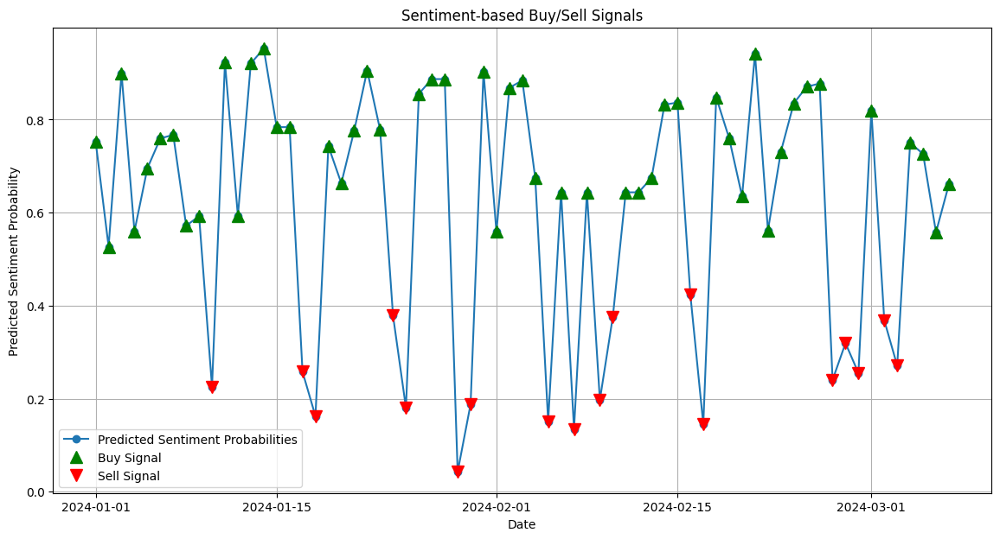

In [ ]:

# Plot the results
plt.figure(figsize=(14, 7))
plt.plot(dates, predicted_probability, label='Predicted Sentiment Probabilities', marker='o')
plt.plot(signals_df[signals_df['Signal'] == 'Buy']['Date'], predicted_probability[signals_df['Signal'] == 'Buy'], '^', markersize=10, color='g', label='Buy Signal')
plt.plot(signals_df[signals_df['Signal'] == 'Sell']['Date'], predicted_probability[signals_df['Signal'] == 'Sell'], 'v', markersize=10, color='r', label='Sell Signal')
plt.title('Sentiment-based Buy/Sell Signals')
plt.xlabel('Date')
plt.ylabel('Predicted Sentiment Probability')
plt.legend()
plt.grid(True)
plt.show()



### Calculate Portfolio Returns and Performance Metrics

In [ ]:
TEST_DF['Returns'] = TEST_DF['Close'].pct_change().fillna(0)

# Calculate metrics
total_return = (TEST_DF['Returns'] + 1).prod() - 1
sharpe_ratio = np.mean(TEST_DF['Returns']) / np.std(TEST_DF['Returns']) * np.sqrt(252)  # Adjusted for daily returns
try:
    max_drawdown = (TEST_DF['Returns'].cumsum().min() - TEST_DF['Returns'].cumsum().max()) / TEST_DF['Returns'].cumsum().max()
except ZeroDivisionError:
    max_drawdown = 0  # or appropriate fallback
num_trades = len(TEST_DF)
win_ratio = (TEST_DF['Returns'] > 0).mean()

# Print metrics
print(f"Total Returns: {total_return * 100:.2f}%")
print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
print(f"Maximum Drawdown: {max_drawdown * 100:.2f}%")
print(f"Number of Trades Executed: {num_trades}")
print(f"Win Ratio: {win_ratio * 100:.2f}%")

Total Returns: 240.41%
Sharpe Ratio: 5.19
Maximum Drawdown: -107.79%
Number of Trades Executed: 67
Win Ratio: 64.18%
